In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances

In [2]:
# read in embedding_768_TCGA_COAD.csv
data = pd.read_csv('/home/qiuaodon/Desktop/project_data_new/embedding_768_TCGA_COAD.csv', header=None)

In [3]:
print(f"Data shape: {data.shape}")

Data shape: (461, 770)


In [4]:
# remove the last two columns
data = data.iloc[:, :-2]

In [6]:
data = data.drop(index=0).reset_index(drop=True)


In [11]:
data

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,-0.457220,0.851885,0.540813,-0.423622,0.714115,-0.564329,1.607602,0.543431,-0.870704,0.980508,...,0.673500,0.445102,0.272053,0.577840,-0.313309,0.463409,0.216033,1.875605,-0.811024,-1.250726
1,-0.387709,0.730046,0.720710,-0.723050,0.841878,-0.463233,1.442049,0.573482,-0.817522,1.146394,...,0.287993,0.639623,0.308657,0.696497,-0.164076,0.249183,0.075877,2.179679,-0.814272,-1.311477
2,-0.430112,0.766393,0.768542,-0.344121,0.560576,-0.597754,1.708495,0.419003,-0.934103,1.152953,...,0.578889,0.539531,0.399675,0.471158,-0.089670,0.701613,0.178599,1.802830,-0.844305,-1.300183
3,-0.417006,0.964753,0.525541,-0.572356,0.777732,-0.462124,1.476457,0.640170,-0.722137,1.066126,...,0.475959,0.557490,0.094860,0.659872,-0.243587,0.122108,0.107965,2.146043,-0.946326,-1.345658
4,-0.276354,0.766071,0.612194,-0.596442,0.814464,0.016801,1.598807,0.929635,-0.914753,1.071625,...,0.395806,0.545849,0.290805,0.229333,-0.536335,0.017757,-0.074384,2.026599,-0.776906,-0.934953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
455,-0.359843,0.929950,0.543955,-0.350527,0.404216,-0.566966,1.688820,0.196331,-1.050643,1.162059,...,0.802867,0.499934,0.404179,0.325667,-0.166769,0.612408,0.197617,1.686868,-0.917694,-1.251037
456,-0.480253,0.931134,0.455165,-0.714430,0.685353,-0.373306,1.511218,0.747226,-0.652520,0.907837,...,0.179997,0.744851,0.062442,0.249245,-0.573766,-0.159084,-0.157464,2.173445,-0.916892,-1.098334
457,-0.397405,0.793659,0.682602,-0.526544,0.733674,-0.456034,1.593480,0.500975,-0.982290,1.068642,...,0.514841,0.515760,0.324934,0.458768,-0.172873,0.498273,0.168238,1.823696,-0.805411,-1.238766
458,-0.422558,0.896717,0.599262,-0.347394,0.683292,-0.429929,1.659195,0.494966,-0.979689,1.184772,...,0.552484,0.555800,0.340869,0.324060,-0.257918,0.544318,0.087316,1.892267,-0.869365,-1.202163


In [8]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import random

# Set a seed for reproducibility
random.seed(42)
np.random.seed(42)

# Transpose the data so that features are now samples
data_T = data.T  # Assuming 'data' is a pandas DataFrame

# Parameters
num_clusters_range = range(2, 11)  # Testing cluster counts from 2 to 10
n_resamples = 100  # Number of resampling iterations

# Initialize variables
num_features = data_T.shape[0]  # Number of features (now samples)
consensus_matrices = {}  # To store consensus matrices for each cluster count

# Perform consensus clustering on features
for n_clusters in num_clusters_range:
    print(f"Processing {n_clusters} clusters...")
    temp_matrix = np.zeros((num_features, num_features))
    
    for _ in range(n_resamples):
        # Randomly sample 80% of the patients (now features) without replacement
        sample_indices = np.random.choice(data_T.columns, size=int(data_T.shape[1] * 0.8), replace=False)
        sampled_data = data_T.loc[:, sample_indices]
        
        # Apply KMeans clustering to the features
        kmeans = KMeans(n_clusters=n_clusters, n_init=10, random_state=None)
        labels = kmeans.fit_predict(sampled_data)
        
        # Update the co-occurrence matrix
        for i in range(num_features):
            for j in range(num_features):
                if labels[i] == labels[j]:
                    temp_matrix[i, j] += 1
    
    # Normalize the temporary matrix
    temp_matrix /= n_resamples
    # Store the consensus matrix for this cluster count
    consensus_matrices[n_clusters] = temp_matrix




Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f917f5e3b00>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

Processing 2 clusters...


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f9188640220>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

Processing 3 clusters...


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f917e642ac0>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

Processing 4 clusters...


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f917e642b60>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

Processing 5 clusters...


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f917e642b60>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

Processing 6 clusters...


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f917e642ac0>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

Processing 7 clusters...


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f917e642ac0>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

Processing 8 clusters...


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f917e642b60>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

Processing 9 clusters...


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f91d880ac00>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

Processing 10 clusters...


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f91d880ac00>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

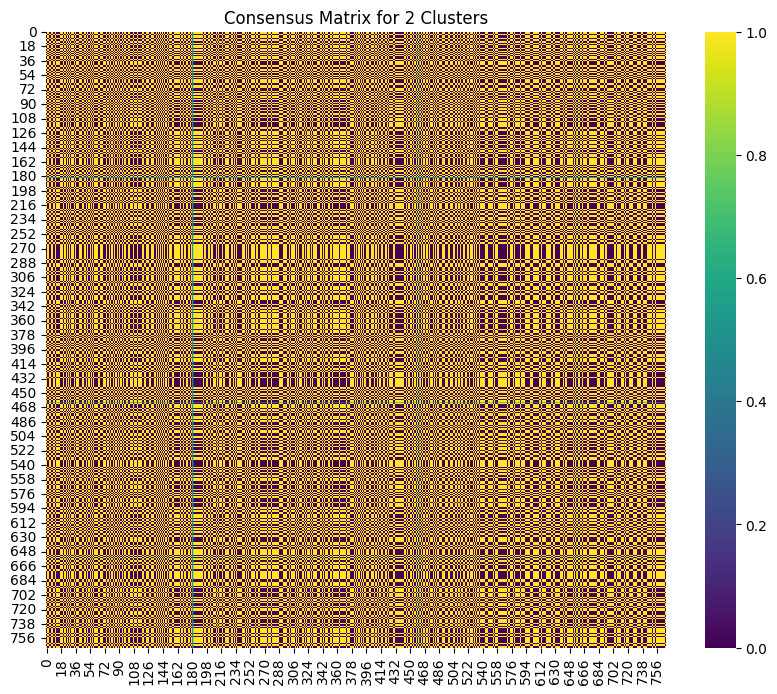

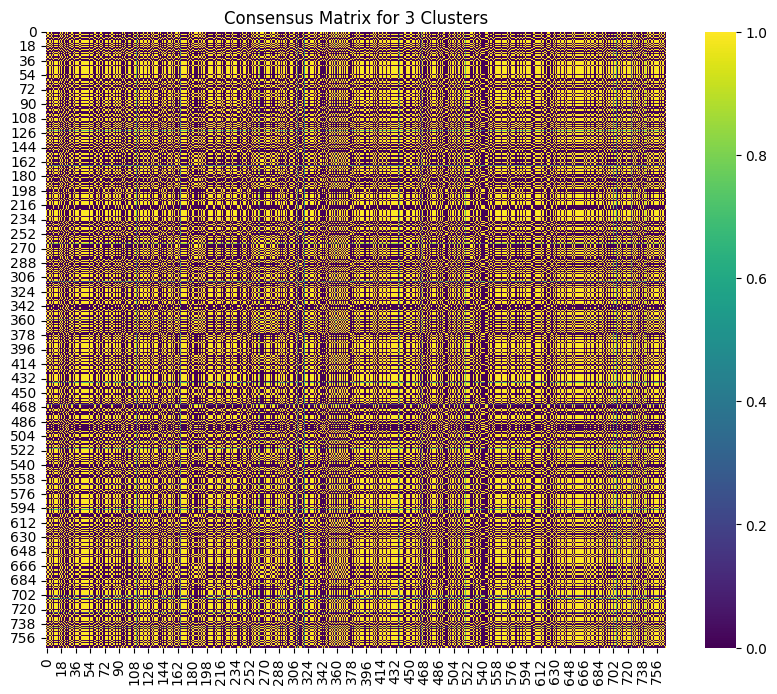

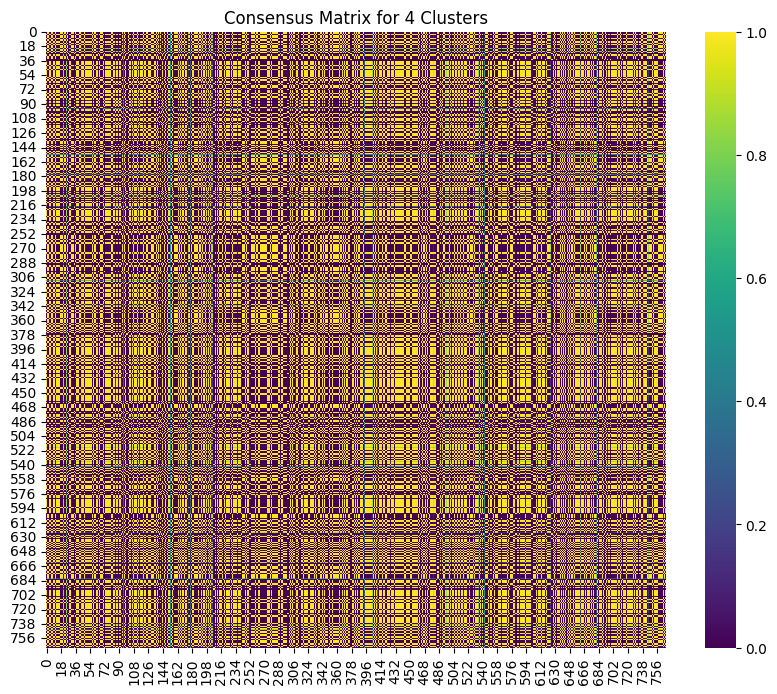

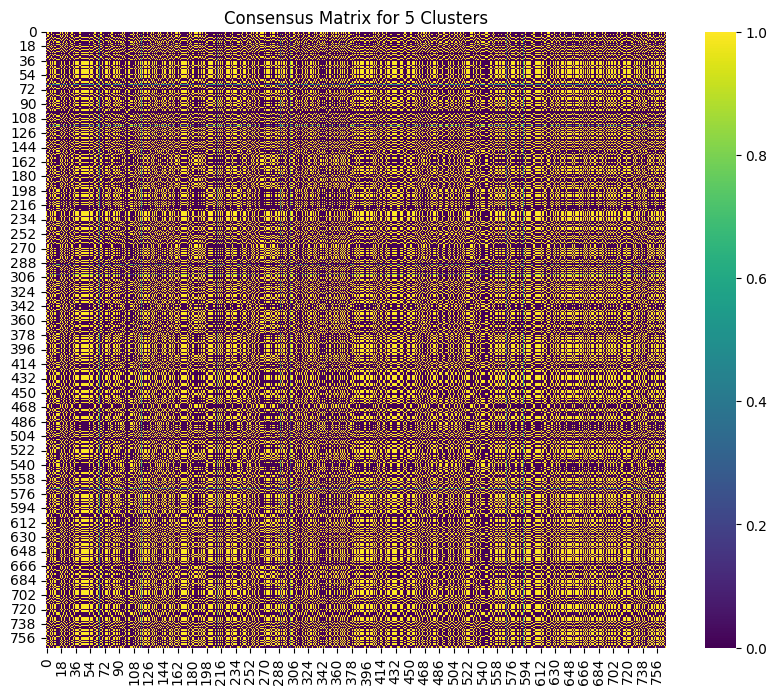

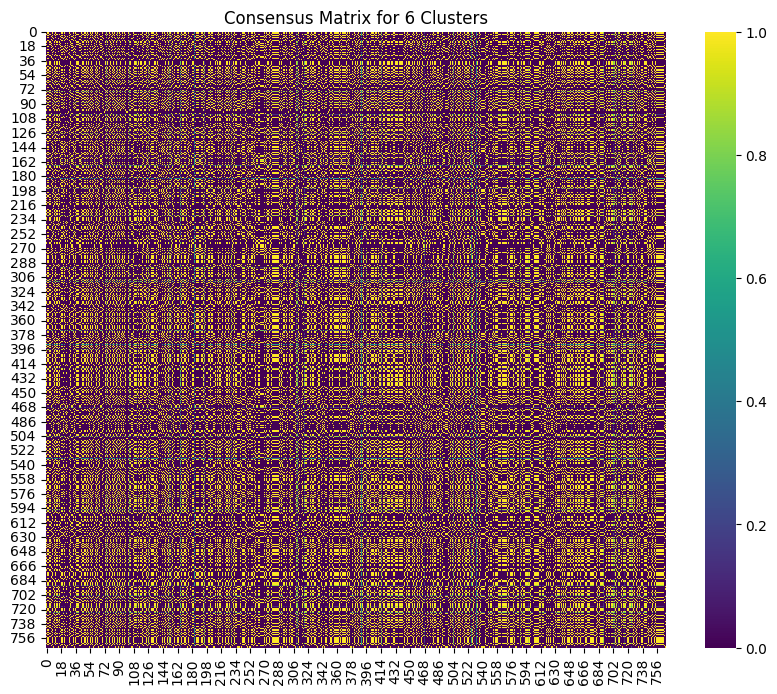

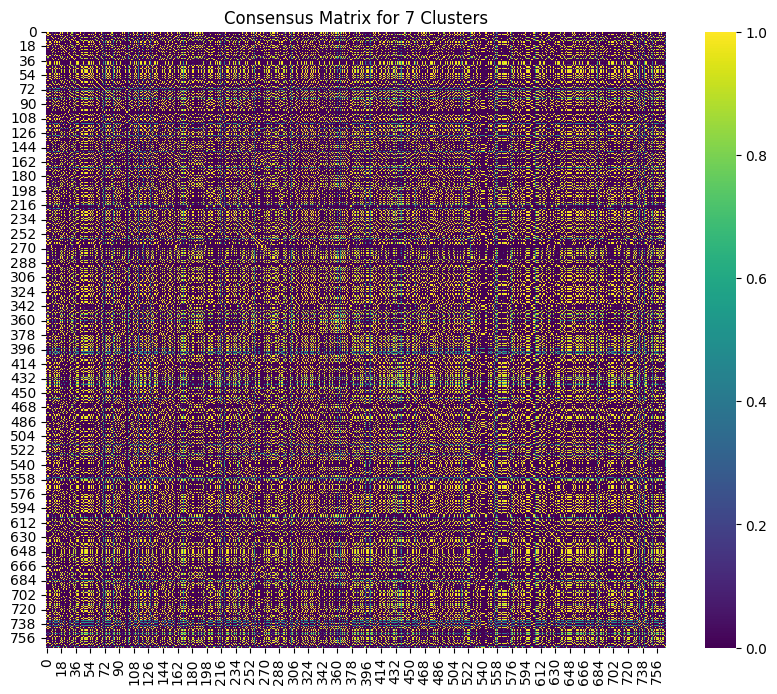

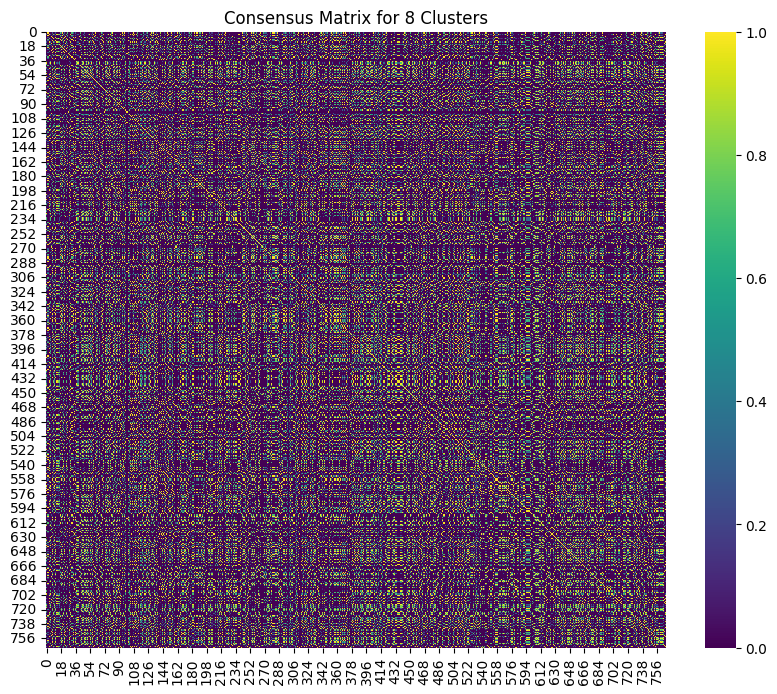

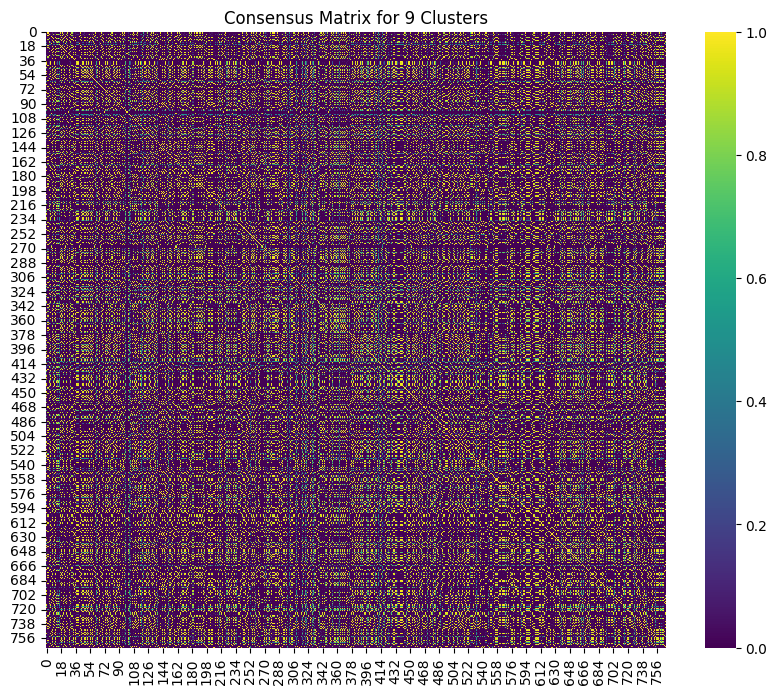

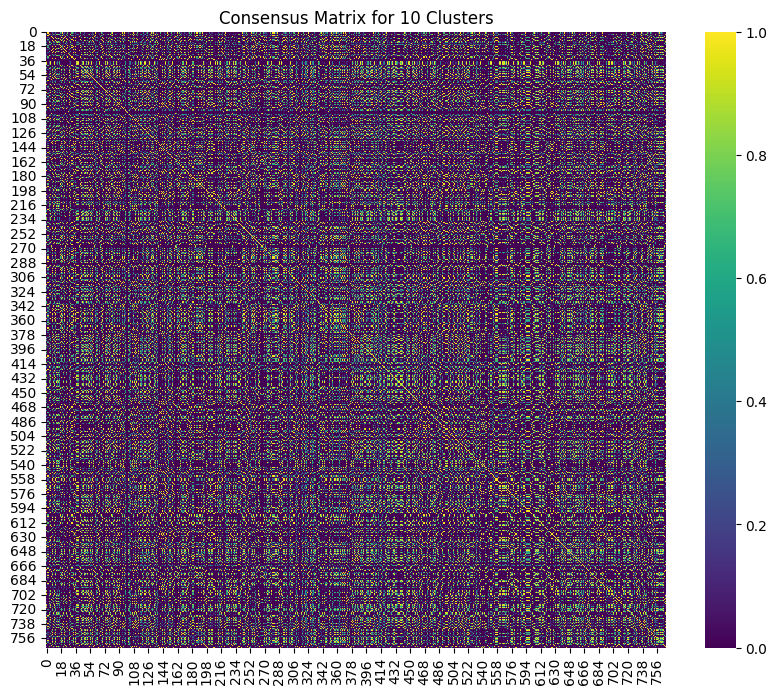

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

for n_clusters, consensus_matrix in consensus_matrices.items():
    plt.figure(figsize=(10, 8))
    sns.heatmap(consensus_matrix, cmap='viridis')
    plt.title(f'Consensus Matrix for {n_clusters} Clusters')
    plt.show()


In [20]:
def calculate_pac(consensus_matrix, lower_bound=0.1, upper_bound=0.9):
    import numpy as np
    consensus_values = consensus_matrix.flatten()
    pac = np.mean((consensus_values > lower_bound) & (consensus_values < upper_bound))
    return pac

pac_scores = {}
for n_clusters, consensus_matrix in consensus_matrices.items():
    pac_score = calculate_pac(consensus_matrix)
    pac_scores[n_clusters] = pac_score
    print(f'PAC score for {n_clusters} clusters: {pac_score}')


PAC score for 2 clusters: 0.010372585720486112
PAC score for 3 clusters: 0.028917100694444444
PAC score for 4 clusters: 0.040822347005208336
PAC score for 5 clusters: 0.011996799045138888
PAC score for 6 clusters: 0.03312513563368055
PAC score for 7 clusters: 0.11155870225694445
PAC score for 8 clusters: 0.20415242513020834
PAC score for 9 clusters: 0.10559760199652778
PAC score for 10 clusters: 0.23134019639756945


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f91d5c27920>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

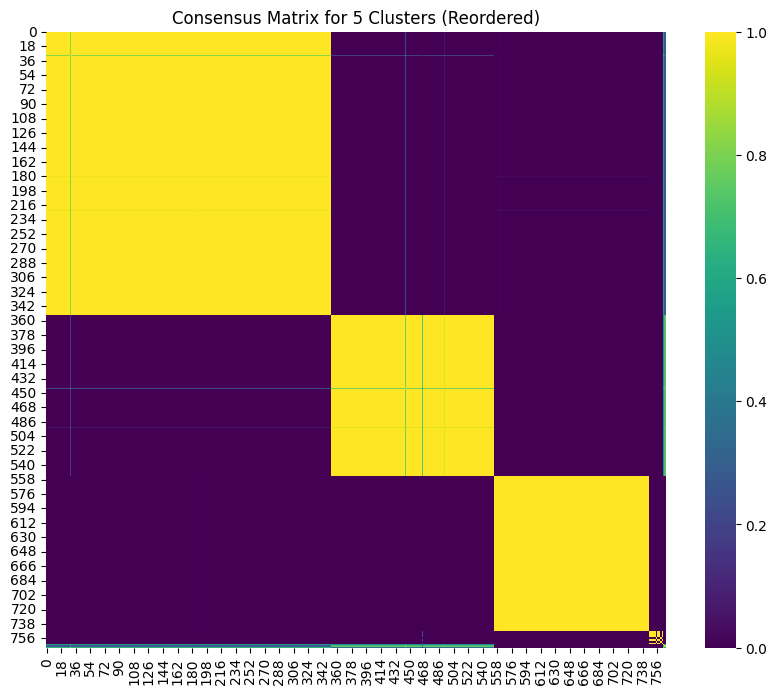

In [14]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
consensus_matrix = consensus_matrices[5]
# Assuming consensus_matrix is your consensus matrix and you have performed KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=42)
cluster_labels = kmeans.fit_predict(consensus_matrix)  # Replace with actual clustering result if different

# Reorder the consensus matrix by cluster labels
sorted_indices = np.argsort(cluster_labels)
sorted_matrix = consensus_matrix[sorted_indices, :][:, sorted_indices]

# Plot the reordered consensus matrix
plt.figure(figsize=(10, 8))
sns.heatmap(sorted_matrix, cmap='viridis')
plt.title('Consensus Matrix for 5 Clusters (Reordered)')
plt.show()


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f917e4fc040>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

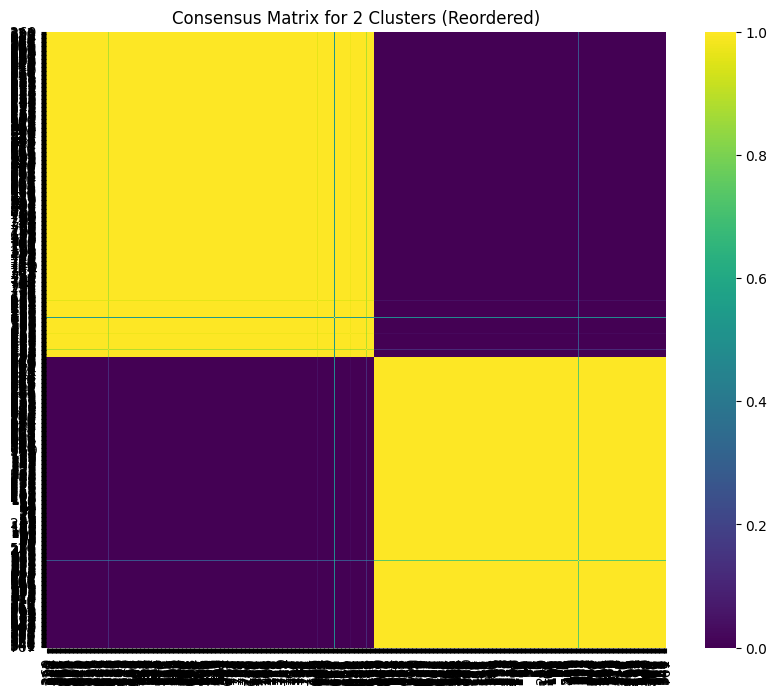

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f9174362980>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

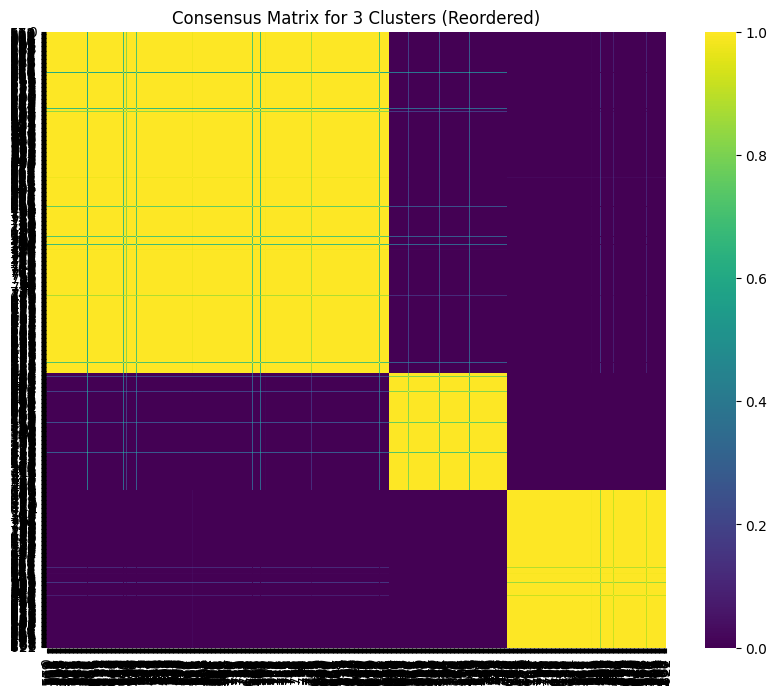

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f91681984a0>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

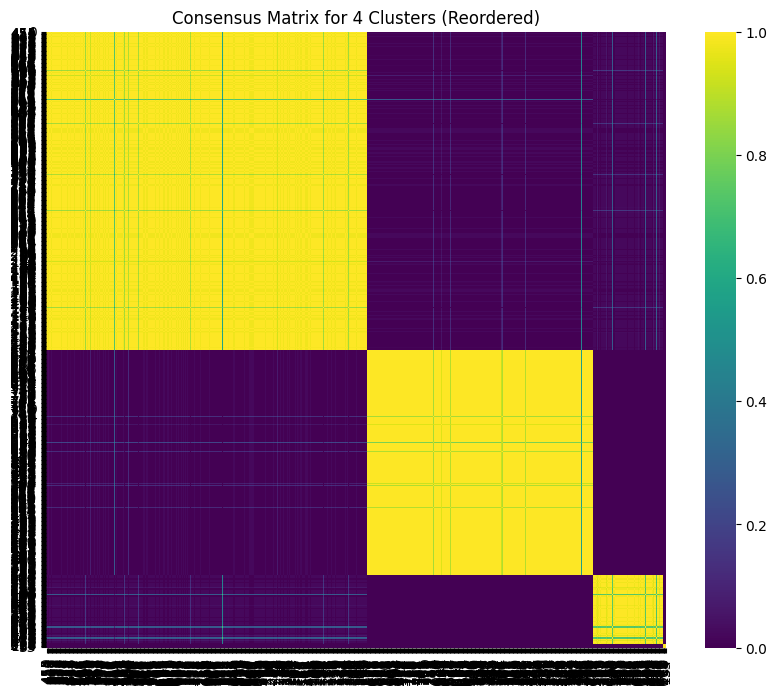

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f9168259a80>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

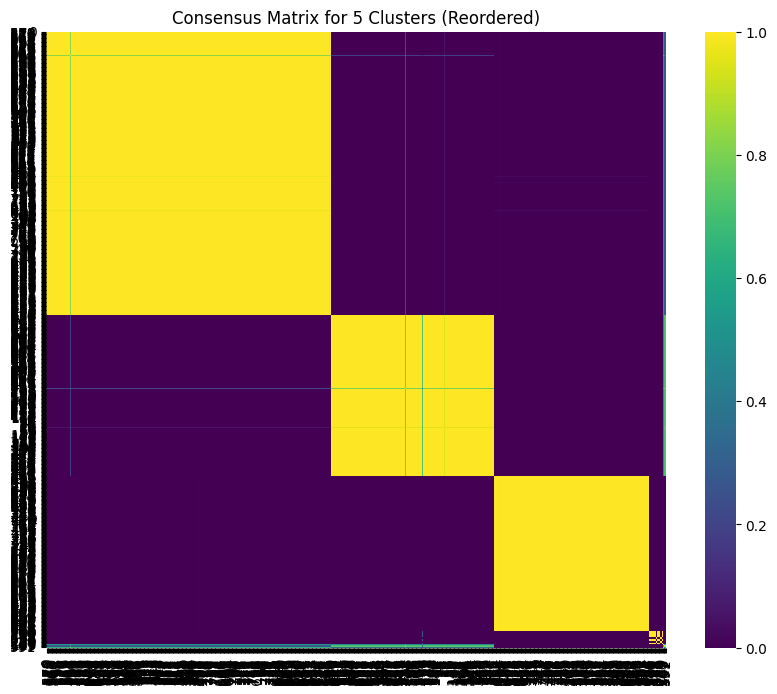

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f9140c958a0>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

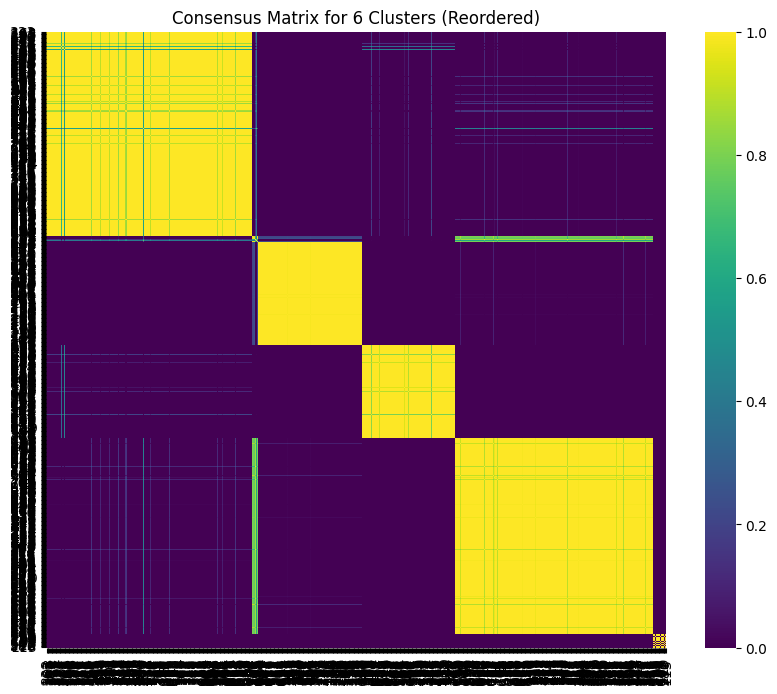

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f9140b55580>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

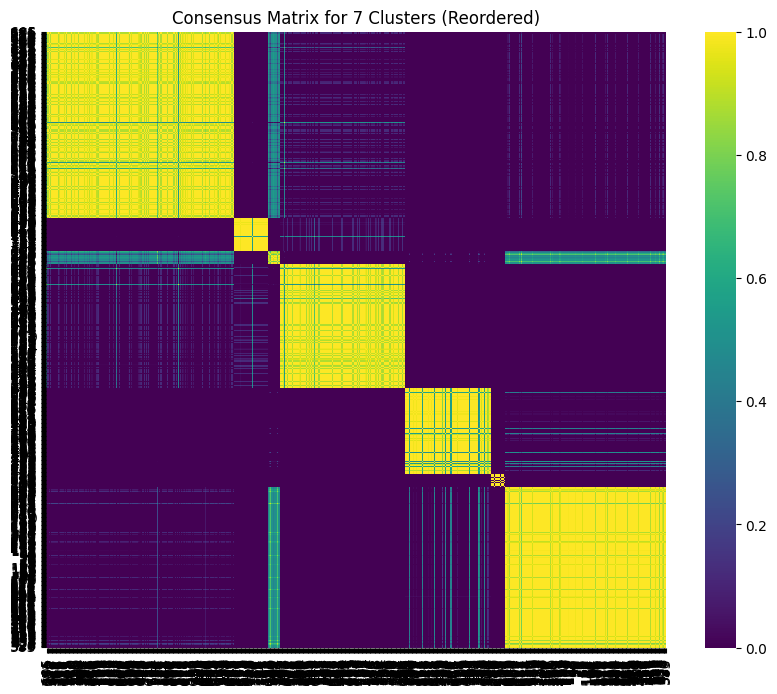

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f9141019580>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

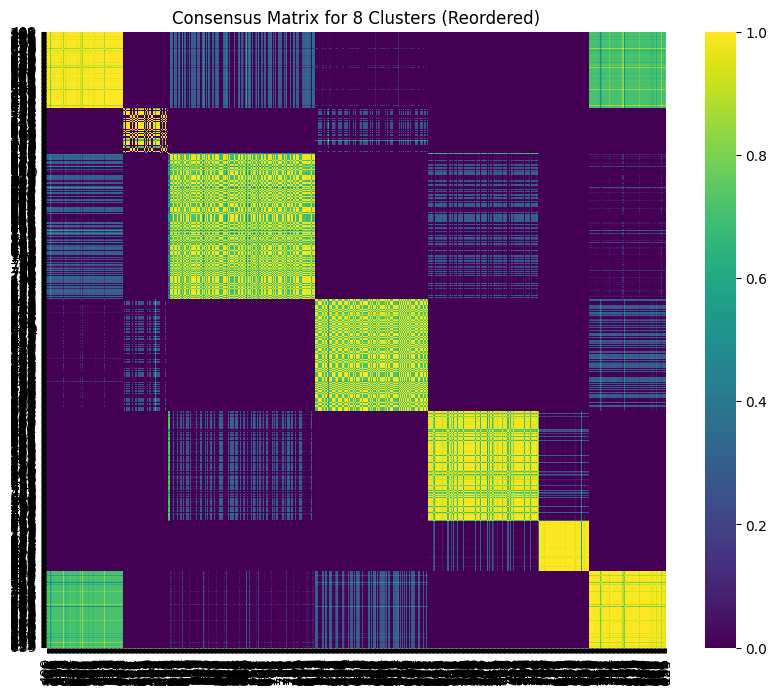

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f9168345580>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

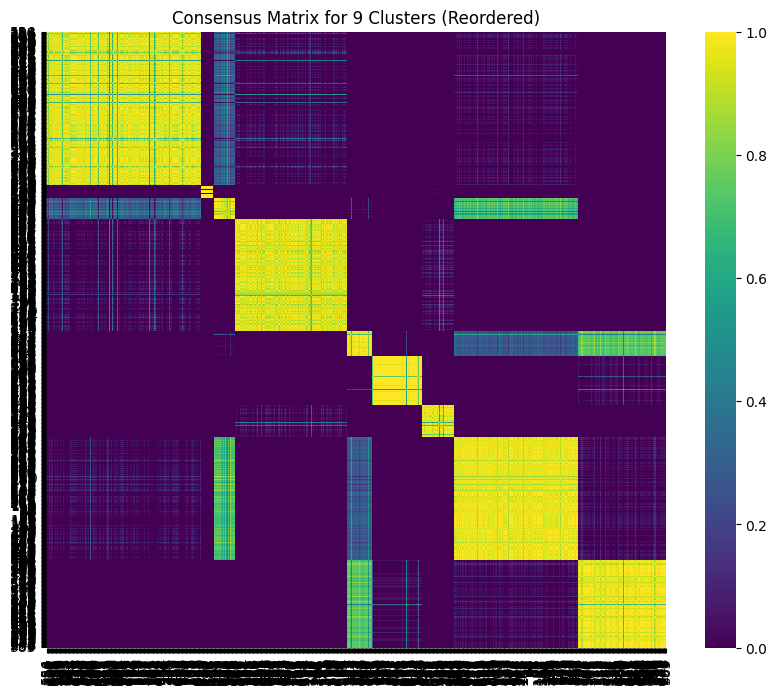

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f9140f5d580>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

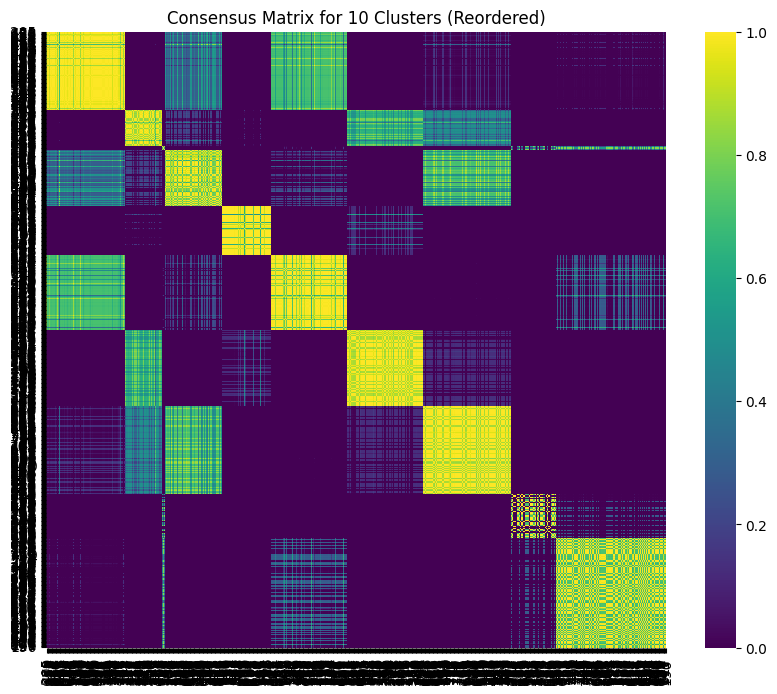

In [15]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Function to plot consensus matrices for multiple cluster numbers
def plot_consensus_matrices(consensus_matrices, cluster_range):
    for n_clusters in cluster_range:
        # Get the consensus matrix for the given number of clusters
        consensus_matrix = consensus_matrices[n_clusters]

        # Perform KMeans clustering on the consensus matrix
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        cluster_labels = kmeans.fit_predict(consensus_matrix)

        # Reorder the consensus matrix and feature indices by the cluster labels
        sorted_indices = np.argsort(cluster_labels)
        sorted_matrix = consensus_matrix[sorted_indices, :][:, sorted_indices]
        sorted_feature_indices = np.array(range(len(consensus_matrix)))[sorted_indices]  # Reorder feature indices

        # Plot the reordered consensus matrix
        plt.figure(figsize=(10, 8))
        sns.heatmap(sorted_matrix, cmap='viridis', xticklabels=sorted_feature_indices, yticklabels=sorted_feature_indices)
        plt.title(f'Consensus Matrix for {n_clusters} Clusters (Reordered)')
        plt.show()

# Define the range of cluster numbers you want to plot
cluster_range = range(2, 11)

# Plot consensus matrices for clusters 2 to 10
plot_consensus_matrices(consensus_matrices, cluster_range)


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f9141d309a0>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

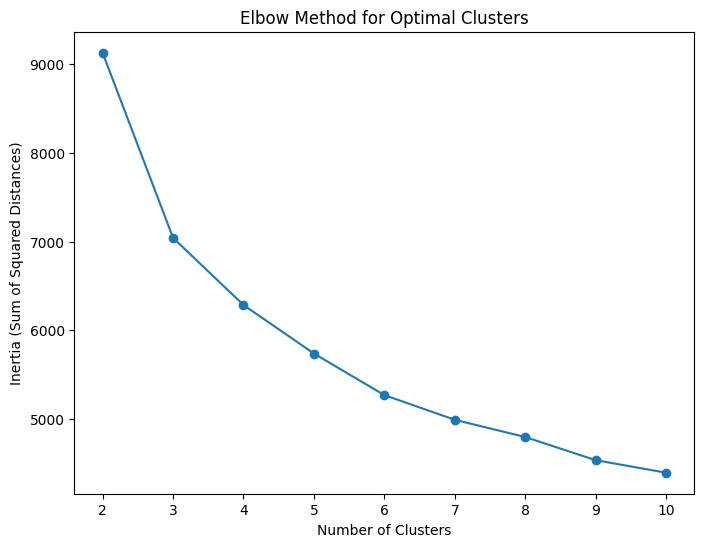

In [16]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

def plot_elbow_method(data, cluster_range):
    inertia = []
    
    # Compute inertia for different numbers of clusters
    for n_clusters in cluster_range:
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        kmeans.fit(data)
        inertia.append(kmeans.inertia_)
    
    # Plot inertia vs. number of clusters
    plt.figure(figsize=(8, 6))
    plt.plot(cluster_range, inertia, marker='o')
    plt.title('Elbow Method for Optimal Clusters')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia (Sum of Squared Distances)')
    plt.xticks(cluster_range)
    plt.show()

# Define the range of cluster numbers to test
cluster_range = range(2, 11)

# Call the function using your data (assuming `data` is your dataset)
plot_elbow_method(data, cluster_range)


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f91742e1760>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

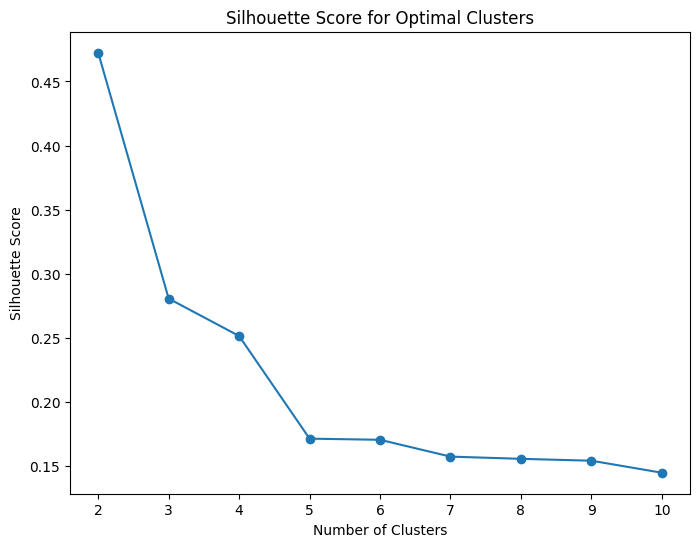

In [17]:
from sklearn.metrics import silhouette_score

def plot_silhouette_score(data, cluster_range):
    silhouette_avg = []
    
    # Compute the silhouette score for different numbers of clusters
    for n_clusters in cluster_range:
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        cluster_labels = kmeans.fit_predict(data)
        silhouette_avg.append(silhouette_score(data, cluster_labels))
    
    # Plot silhouette score vs. number of clusters
    plt.figure(figsize=(8, 6))
    plt.plot(cluster_range, silhouette_avg, marker='o')
    plt.title('Silhouette Score for Optimal Clusters')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')
    plt.xticks(cluster_range)
    plt.show()

# Call the function using your data (assuming `data` is your dataset)
plot_silhouette_score(data, cluster_range)


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f917f61a660>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

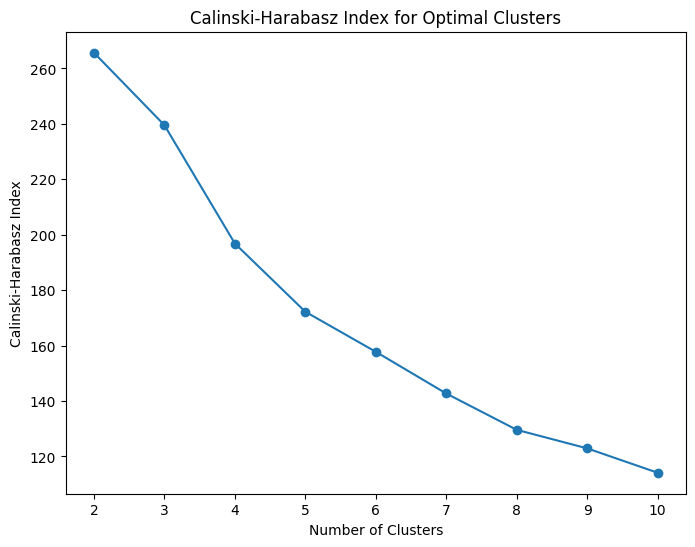

In [18]:
from sklearn.metrics import calinski_harabasz_score

def plot_calinski_harabasz(data, cluster_range):
    ch_scores = []
    
    # Compute the Calinski-Harabasz index for different numbers of clusters
    for n_clusters in cluster_range:
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        cluster_labels = kmeans.fit_predict(data)
        ch_scores.append(calinski_harabasz_score(data, cluster_labels))
    
    # Plot the Calinski-Harabasz index vs. number of clusters
    plt.figure(figsize=(8, 6))
    plt.plot(cluster_range, ch_scores, marker='o')
    plt.title('Calinski-Harabasz Index for Optimal Clusters')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Calinski-Harabasz Index')
    plt.xticks(cluster_range)
    plt.show()

# Call the function using your data
plot_calinski_harabasz(data, cluster_range)


Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f9141d1bb00>
Traceback (most recent call last):
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
                   ^^^^^^^^^^^^^^^^^^
  File "/home/qiuaodon/anaconda3/lib/python3.11/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
             ^^^^^^^^^^^^^^^^^^
AttributeError: 'NoneType' object has

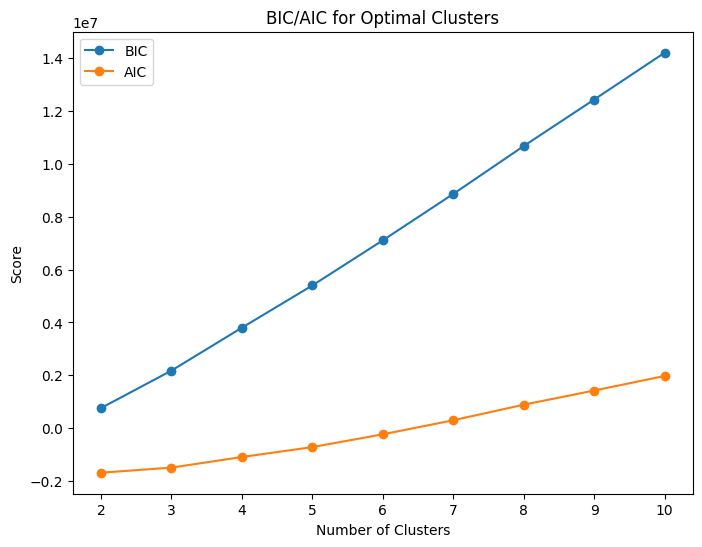

In [19]:
from sklearn.mixture import GaussianMixture

def plot_bic_aic(data, cluster_range):
    bic_scores = []
    aic_scores = []
    
    # Compute BIC and AIC for different numbers of clusters using GMM
    for n_clusters in cluster_range:
        gmm = GaussianMixture(n_components=n_clusters, random_state=42)
        gmm.fit(data)
        bic_scores.append(gmm.bic(data))
        aic_scores.append(gmm.aic(data))
    
    # Plot BIC and AIC vs. number of clusters
    plt.figure(figsize=(8, 6))
    plt.plot(cluster_range, bic_scores, marker='o', label='BIC')
    plt.plot(cluster_range, aic_scores, marker='o', label='AIC')
    plt.title('BIC/AIC for Optimal Clusters')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Score')
    plt.legend()
    plt.xticks(cluster_range)
    plt.show()

# Call the function using your data
plot_bic_aic(data, cluster_range)


PAC score for 2 clusters: 0.010372585720486112
PAC score for 3 clusters: 0.028917100694444444
PAC score for 4 clusters: 0.040822347005208336
PAC score for 5 clusters: 0.011996799045138888
PAC score for 6 clusters: 0.03312513563368055
PAC score for 7 clusters: 0.11155870225694445
PAC score for 8 clusters: 0.20415242513020834
PAC score for 9 clusters: 0.10559760199652778
PAC score for 10 clusters: 0.23134019639756945


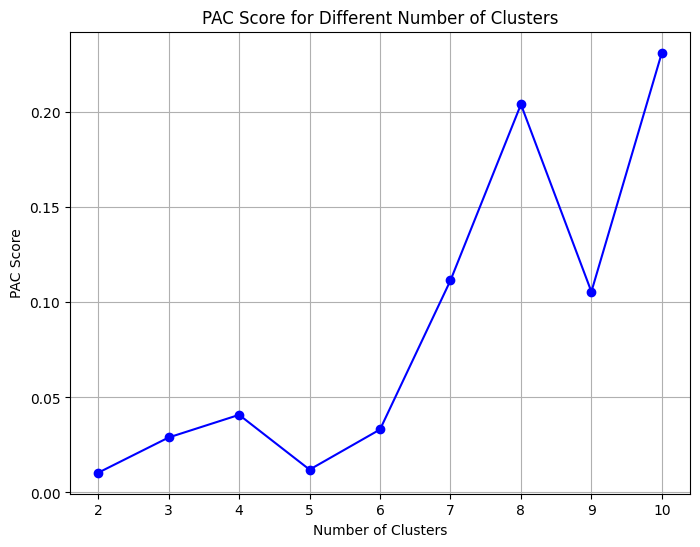

In [21]:
import numpy as np
import matplotlib.pyplot as plt

def calculate_pac(consensus_matrix, lower_bound=0.1, upper_bound=0.9):
    """
    Calculate the Proportion of Ambiguous Clustering (PAC) score.

    Parameters:
    - consensus_matrix: The consensus matrix from consensus clustering.
    - lower_bound: The lower threshold for ambiguity (default is 0.1).
    - upper_bound: The upper threshold for ambiguity (default is 0.9).

    Returns:
    - pac_score: The PAC score, where a lower value indicates more stable clustering.
    """
    # Flatten the consensus matrix into a 1D array of values
    consensus_values = consensus_matrix.flatten()

    # Count the proportion of values between lower_bound and upper_bound
    ambiguous_proportion = np.mean((consensus_values > lower_bound) & (consensus_values < upper_bound))

    return ambiguous_proportion

def plot_pac_scores(consensus_matrices, cluster_range):
    """
    Plot the PAC scores for different numbers of clusters.

    Parameters:
    - consensus_matrices: A dictionary of consensus matrices, where the key is the number of clusters.
    - cluster_range: The range of cluster numbers to compute PAC scores for.
    """
    pac_scores = []

    # Calculate PAC scores for each cluster number
    for n_clusters in cluster_range:
        consensus_matrix = consensus_matrices[n_clusters]
        pac_score = calculate_pac(consensus_matrix)
        pac_scores.append(pac_score)
        print(f'PAC score for {n_clusters} clusters: {pac_score}')

    # Plot PAC scores
    plt.figure(figsize=(8, 6))
    plt.plot(cluster_range, pac_scores, marker='o', linestyle='-', color='b')
    plt.title('PAC Score for Different Number of Clusters')
    plt.xlabel('Number of Clusters')
    plt.ylabel('PAC Score')
    plt.xticks(cluster_range)
    plt.grid(True)
    plt.show()

# Example usage:
# Assuming `consensus_matrices` is a dictionary with cluster numbers as keys and consensus matrices as values
cluster_range = range(2, 11)  # For clusters 2 through 10
plot_pac_scores(consensus_matrices, cluster_range)
